# Enhancing Community Well-being Through Public Transport Accessibility

<div class="usecase-authors"><b>Authored by:</b> <b> Sai Priyamvada</b></div>

<div class="usecase-duration"><b>Duration:</b> 90 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>Intermediate</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>Python, matpotlib,numpy, Data Science, Geospatial Analysis,Folium</div>
</div>

<div class="usecase-section-header"> <b>SCENARIO</b></div>

- As a public health researcher, I want to analyze the impact of public transport accessibility on the health and well-being of Melbourne residents.

Public transport can significantly influence people's access to health services, social connections, and overall   quality of life. This analysis aims to identify how proximity to bus and tram stops correlates with various well-being indicators, such as physical and mental health.

- As a city planner, I want to understand the relationship between public transport access and community participation.

Community participation can be facilitated by convenient public transport options, allowing residents to engage in social activities, work, and leisure. This analysis will help in planning public transport routes to enhance community connectivity.

<div class="usecase-section-header"><b> What this use case will teach you</b></div>
<b> At the end of this use case you will:</b>

- Learn how to import and integrate data from multiple sources, including survey data and geospatial data.
- Understand methods for geocoding and calculating distances between locations.
- Gain skills in analyzing and visualizing the relationship between public transport accessibility and community well-being indicators.
- Be able to present findings that can influence public policy and urban planning decisions.

<div class="usecase-section-header"><b> Introduction or background relating to problem </b> </div>

Public transport plays a crucial role in urban settings, offering accessibility and mobility to residents. For a city like Melbourne, which is known for its high quality of life, understanding the role of public transport in enhancing community well-being is vital. This analysis seeks to explore how close proximity to bus and tram stops influences residents' physical health, mental well-being, social connections, and participation in community activities.

</b> Key Factors of Analysis </b>

- Physical Health: How does public transport accessibility impact access to healthcare services and physical activity levels?
- Mental Well-being: Is there a correlation between easy access to public transport and reduced stress or improved mental health?
- Community Participation: Does proximity to public transport encourage participation in social and community activities?
- Social Connectedness: How does public transport influence social interactions and connections?

<b> DATASETS : </b>

- Dataset 1: https://data.melbourne.vic.gov.au/explore/dataset/social-indicators-for-city-of-melbourne-residents-2023/information/
Title: Social Indicators for City of Melbourne Residents 2023 (CoMSIS)
Source: City of Melbourne Open Data Portal
Description: This dataset provides comprehensive social and demographic data for Melbourne residents, including health, well-being, and transport-related information.

- Dataset 2: https://data.melbourne.vic.gov.au/explore/dataset/bus-stops/information/
Title: Bus Stops
Source: City of Melbourne Open Data Portal
Description: This dataset contains the location of bus stops within the city of Melbourne.

- Dataset 3: : https://data.melbourne.vic.gov.au/explore/dataset/tram-tracks/export/
Title: Tram Stops
Source: City of Melbourne Open Data Portal
Description: This dataset contains the location of tram stops within the city of Melbourne.


- <b>PART-1  DOWNLOADING DATASETS</b>
- <b>PART-2  DATA CLEANING</b>
- <b>PART-3  DATA INTEGRATION</b>
- <b>PART-4  EXPLORATIVE DATA ANALYSIS</b>
- <b>Part-5  STATISTICAL AND SPATIAL ANALYSIS</b>
- <b>PART-6  VISUALIZATION AND ANALYSIS OF PUBLIC TRANSPORT ACCESSIBILITY AND ITS IMPACT ON HEALTH OUTCOMES</b>
- <b>Part-7  RECOMMENDATIONS</b>


Importing Libraries

In [1]:
pip install geopandas && pip install matplotlib && pip install seaborn && pip install esda splot && pip install geopy


/bin/bash: pip: command not found
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import requests
from io import StringIO
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
import json
from shapely.geometry import shape, Point
from bs4 import BeautifulSoup
from geopy.distance import geodesic
from geopy.geocoders import Nominatim
import time

import statsmodels.api as sm
from statsmodels.formula.api import ols

import folium
from folium.plugins import MarkerCluster
from IPython.display import display

<b> PART-1  DOWNLOADING DATA SETS </b>
- Downloading and Loading Datasets from the City of Melbourne API
In this section, we are automating the process of downloading datasets directly from the City of Melbourne Open Data Portal using their API. The datasets we will download includes:

- Social Indicators for City of Melbourne Residents 2023 – Contains information on social and demographic factors like health and well-being.
- Bus Stops – Provides the geographical locations of bus stops in the city.
- Tram Tracks – Contains the location of tram stops in Melbourne.

In [3]:
def download_dataset(api_key, dataset_id, base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'):
    format = 'csv'
    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  
        'lang': 'en',
        'timezone': 'UTC',
        'api_key': api_key
    }

    with requests.get(url, params=params, stream=True) as response:
        if response.status_code == 200:
            total_size = int(response.headers.get('content-length', 0))
            chunk_size = 1024  
            progress_bar = tqdm(total=total_size, unit='iB', unit_scale=True, desc=f"Downloading {dataset_id}")

            content = bytearray()
            for chunk in response.iter_content(chunk_size=chunk_size):
                if chunk:  
                    content.extend(chunk)
                    progress_bar.update(len(chunk))

            progress_bar.close()
            data = pd.read_csv(StringIO(content.decode('utf-8')), delimiter=';')
            return data
        else:
            print(f'Request failed with status code {response.status_code}')
            return None

# Dataset IDs
dataset_ids = ['tram-tracks', 'bus-stops', 'social-indicators-for-city-of-melbourne-residents-2023']

# Initialize dictionary to hold the datasets
datasets = {}

# Download each dataset with a progress bar
for dataset_id in dataset_ids:
    datasets[dataset_id] = download_dataset('', dataset_id)
    if datasets[dataset_id] is not None:
        print(f"{dataset_id} downloaded successfully.")

# Convert datasets to DataFrames
social_indicators_df = datasets['social-indicators-for-city-of-melbourne-residents-2023']#data set 1
bus_stops_df = datasets['bus-stops']#dataset 2
tram_tracks_df = datasets['tram-tracks']#dataset 3

tram-tracks downloaded successfully.


bus-stops downloaded successfully.


social-indicators-for-city-of-melbourne-residents-2023 downloaded successfully.


<b> PART-2 DATA CLEANING </b>

<b> Data set 1: Social Indicators Data Cleaning </b>
- Remove duplicates: Checking for and removing any duplicate rows. 
- Handle missing values: Identifying any missing values and deciding on an appropriate method to handle them. 
- Ensure correct data types: Verifying that the data types of each column are appropriate.
- Standardize text data: Ensureing that text data is consistently formatted .

In [4]:
social_indicators_df.head()
social_indicators_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 594 entries, 0 to 593
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   indicator         594 non-null    object 
 1   type              594 non-null    object 
 2   topic             594 non-null    object 
 3   description       594 non-null    object 
 4   response          594 non-null    object 
 5   respondent_group  594 non-null    object 
 6   year              594 non-null    int64  
 7   sample_size       594 non-null    int64  
 8   result            594 non-null    float64
 9   format            594 non-null    object 
dtypes: float64(1), int64(2), object(7)
memory usage: 46.5+ KB


In [5]:
social_indicators_df.drop_duplicates(inplace=True)
missing_values = social_indicators_df.isnull().sum()
print("Missing values:\n", missing_values)

Missing values:
 indicator           0
type                0
topic               0
description         0
response            0
respondent_group    0
year                0
sample_size         0
result              0
format              0
dtype: int64


In [6]:
print("Data types:\n", social_indicators_df.dtypes)

Data types:
 indicator            object
type                 object
topic                object
description          object
response             object
respondent_group     object
year                  int64
sample_size           int64
result              float64
format               object
dtype: object


In [7]:
columns_to_clean = ['indicator', 'type', 'topic', 'description', 'response', 'respondent_group', 'format']
for column in columns_to_clean:
    social_indicators_df[column] = social_indicators_df[column].str.strip().str.lower()

# Print the cleaned DataFrame
social_indicators_df.head(500)

,indicator,type,topic,description,response,respondent_group,year,sample_size,result,format
0,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,25-34 years,2023,419,17.1,per cent
1,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,45-54 years,2023,128,15.0,per cent
2,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,65+ years,2023,202,3.6,per cent
3,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,docklands 3008,2023,113,4.5,per cent
4,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,melbourne 3000,2023,338,18.0,per cent
...,...,...,...,...,...,...,...,...,...,...
495,6a,other,food security,worried food would run out,"yes, in the last 12 months",melbourne 3000,2023,341,25.1,per cent
496,6a,other,food security,worried food would run out,"yes, in the last 12 months",parkville 3052,2023,77,20.1,per cent
497,6a,other,food security,worried food would run out,"yes, in the last 12 months",south yarra 3141 / melbourne/st kilda road 3004,2023,138,28.2,per cent
498,6b,other,food security,skipped meals,"yes, in the last 12 months",18-24 years,2023,273,32.0,per cent


In [8]:
#differentiating the respondent_group and location as both are mixed in one column as observed in the previous output
# Creating new columns for age groups and locations
social_indicators_df['age_group'] = social_indicators_df['respondent_group'].apply(lambda x: x if 'years' in x else None)
social_indicators_df['location'] = social_indicators_df['respondent_group'].apply(lambda x: x if 'years' not in x else None)


social_indicators_df.drop('respondent_group', axis=1, inplace=True)



In [9]:
social_indicators_df.head(500)

,indicator,type,topic,description,response,year,sample_size,result,format,age_group,location
0,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,419,17.1,per cent,25-34 years,None
1,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,128,15.0,per cent,45-54 years,None
2,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,202,3.6,per cent,65+ years,None
3,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,113,4.5,per cent,None,docklands 3008
4,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,338,18.0,per cent,None,melbourne 3000
...,...,...,...,...,...,...,...,...,...,...,...
495,6a,other,food security,worried food would run out,"yes, in the last 12 months",2023,341,25.1,per cent,None,melbourne 3000
496,6a,other,food security,worried food would run out,"yes, in the last 12 months",2023,77,20.1,per cent,None,parkville 3052
497,6a,other,food security,worried food would run out,"yes, in the last 12 months",2023,138,28.2,per cent,None,south yarra 3141 / melbourne/st kilda road 3004
498,6b,other,food security,skipped meals,"yes, in the last 12 months",2023,273,32.0,per cent,18-24 years,None


In [82]:


# Initialize geolocator
geolocator = Nominatim(user_agent="my_geocoder")

def get_lat_lon(address):
  try:
    location = geolocator.geocode(address)
    if location:
      return location.latitude, location.longitude
    else:
      return None, None
  except:
    return None, None

# Applied function to create new columns lat,long
social_indicators_df['latitude'], social_indicators_df['longitude'] = zip(*social_indicators_df['location'].apply(get_lat_lon))




In [11]:
# social_indicators_df.loc[social_indicators_df['location'].isnull(), ['latitude', 'longitude']] = None
social_indicators_df['latitude'].fillna(0, inplace=True)
social_indicators_df['longitude'].fillna(0, inplace=True)

social_indicators_df.head(594)

,indicator,type,topic,description,response,year,sample_size,result,format,age_group,location,latitude,longitude
0,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,419,17.1,per cent,25-34 years,None,44.933143,7.540121
1,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,128,15.0,per cent,45-54 years,None,44.933143,7.540121
2,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,202,3.6,per cent,65+ years,None,44.933143,7.540121
3,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,113,4.5,per cent,None,docklands 3008,-37.817542,144.939492
4,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,338,18.0,per cent,None,melbourne 3000,-37.814245,144.963173
...,...,...,...,...,...,...,...,...,...,...,...,...,...
589,9,other,quality of life,satisfaction with life as a whole,average satisfaction score (from 0-100),2023,202,80.6,average,65+ years,None,44.933143,7.540121
590,9,other,quality of life,satisfaction with life as a whole,average satisfaction score (from 0-100),2023,192,69.3,average,None,carlton 3053,-37.800423,144.968434
591,9,other,quality of life,satisfaction with life as a whole,average satisfaction score (from 0-100),2023,1369,72.7,average,None,city of melbourne,-37.812382,144.948265
592,9,other,quality of life,satisfaction with life as a whole,average satisfaction score (from 0-100),2023,69,78.7,average,None,east melbourne 3002,-37.812498,144.985885


<b> DATASET 2: BUS STOP DATASET </b>
- Remove duplicates: Checking for and removing any duplicate rows. 
- Handle missing values: Identifying any missing values and deciding on an appropriate method to handle them. 
- Ensure correct data types: Verifying that the data types of each column are appropriate.
- Standardize text data: Ensureing that text data is consistently formatted.

In [12]:
bus_stops_df.info()
bus_stops_df.head(300)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   geo_point_2d  309 non-null    object 
 1   geo_shape     309 non-null    object 
 2   prop_id       309 non-null    int64  
 3   addresspt1    309 non-null    float64
 4   addressp_1    309 non-null    int64  
 5   asset_clas    309 non-null    object 
 6   asset_type    309 non-null    object 
 7   objectid      309 non-null    int64  
 8   str_id        309 non-null    int64  
 9   addresspt     309 non-null    int64  
 10  asset_subt    0 non-null      float64
 11  model_desc    309 non-null    object 
 12  mcc_id        309 non-null    int64  
 13  roadseg_id    309 non-null    int64  
 14  descriptio    309 non-null    object 
 15  model_no      309 non-null    object 
dtypes: float64(2), int64(7), object(7)
memory usage: 38.8+ KB


,geo_point_2d,geo_shape,prop_id,addresspt1,addressp_1,asset_clas,asset_type,objectid,str_id,addresspt,asset_subt,model_desc,mcc_id,roadseg_id,descriptio,model_no
0,"-37.80384165792465, 144.93239283833262","{""coordinates"": [144.93239283833262, -37.80384...",0,76.819824,357,Signage,Sign - Public Transport,355,1235255,570648,NaN,Sign - Public Transport 1 Panel,1235255,21673,Sign - Public Transport 1 Panel Bus Stop Type 13,P.16
1,"-37.81548699581418, 144.9581794249902","{""coordinates"": [144.9581794249902, -37.815486...",0,21.561304,83,Signage,Sign - Public Transport,600,1231226,548056,NaN,Sign - Public Transport 1 Panel,1231226,20184,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
2,"-37.81353897396532, 144.95728334230756","{""coordinates"": [144.95728334230756, -37.81353...",0,42.177187,207,Signage,Sign - Public Transport,640,1237092,543382,NaN,Sign - Public Transport 1 Panel,1237092,20186,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
3,"-37.82191394843844, 144.95539345270072","{""coordinates"": [144.95539345270072, -37.82191...",0,15.860434,181,Signage,Sign - Public Transport,918,1232777,103975,NaN,Sign - Public Transport 1 Panel,1232777,22174,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
4,"-37.83316401267591, 144.97443745130263","{""coordinates"": [144.97443745130263, -37.83316...",0,0.000000,0,Signage,Sign - Public Transport,1029,1271914,0,NaN,Sign - Public Transport 1 Panel,1271914,22708,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,"-37.830076314348155, 144.96531772571083","{""coordinates"": [144.96531772571083, -37.83007...",0,16.382280,121,Signage,Sign - Public Transport,40427,1239220,110628,NaN,Sign - Public Transport 1 Panel,1239220,22118,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
296,"-37.82097678869638, 144.92581314868238","{""coordinates"": [144.92581314868238, -37.82097...",0,77.355590,154,Signage,Sign - Public Transport,40450,1245195,562527,NaN,Sign - Public Transport 1 Panel,1245195,22156,Sign - Public Transport 1 Panel Bus Stop Type 3,P.16
297,"-37.796717481892664, 144.94652849185758","{""coordinates"": [144.94652849185758, -37.79671...",0,14.595037,215,Signage,Sign - Public Transport,40643,1249762,565421,NaN,Sign - Public Transport 1 Panel,1249762,20907,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
298,"-37.84536002766068, 144.982312412603","{""coordinates"": [144.982312412603, -37.8453600...",0,0.000000,0,Signage,Sign - Public Transport,41418,1255285,0,NaN,Sign - Public Transport 1 Panel,1255285,22308,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16


In [13]:
bus_stops_df.drop_duplicates(inplace=True)
missing_values = bus_stops_df.isnull().sum()
print("Missing values:\n", missing_values)

Missing values:
 geo_point_2d      0
geo_shape         0
prop_id           0
addresspt1        0
addressp_1        0
asset_clas        0
asset_type        0
objectid          0
str_id            0
addresspt         0
asset_subt      309
model_desc        0
mcc_id            0
roadseg_id        0
descriptio        0
model_no          0
dtype: int64


In [14]:
# Drop the column as it's having nan values 
bus_stops_df.drop('asset_subt', axis=1, inplace=True)
bus_stops_df.head(300)

,geo_point_2d,geo_shape,prop_id,addresspt1,addressp_1,asset_clas,asset_type,objectid,str_id,addresspt,model_desc,mcc_id,roadseg_id,descriptio,model_no
0,"-37.80384165792465, 144.93239283833262","{""coordinates"": [144.93239283833262, -37.80384...",0,76.819824,357,Signage,Sign - Public Transport,355,1235255,570648,Sign - Public Transport 1 Panel,1235255,21673,Sign - Public Transport 1 Panel Bus Stop Type 13,P.16
1,"-37.81548699581418, 144.9581794249902","{""coordinates"": [144.9581794249902, -37.815486...",0,21.561304,83,Signage,Sign - Public Transport,600,1231226,548056,Sign - Public Transport 1 Panel,1231226,20184,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
2,"-37.81353897396532, 144.95728334230756","{""coordinates"": [144.95728334230756, -37.81353...",0,42.177187,207,Signage,Sign - Public Transport,640,1237092,543382,Sign - Public Transport 1 Panel,1237092,20186,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
3,"-37.82191394843844, 144.95539345270072","{""coordinates"": [144.95539345270072, -37.82191...",0,15.860434,181,Signage,Sign - Public Transport,918,1232777,103975,Sign - Public Transport 1 Panel,1232777,22174,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
4,"-37.83316401267591, 144.97443745130263","{""coordinates"": [144.97443745130263, -37.83316...",0,0.000000,0,Signage,Sign - Public Transport,1029,1271914,0,Sign - Public Transport 1 Panel,1271914,22708,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,"-37.830076314348155, 144.96531772571083","{""coordinates"": [144.96531772571083, -37.83007...",0,16.382280,121,Signage,Sign - Public Transport,40427,1239220,110628,Sign - Public Transport 1 Panel,1239220,22118,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
296,"-37.82097678869638, 144.92581314868238","{""coordinates"": [144.92581314868238, -37.82097...",0,77.355590,154,Signage,Sign - Public Transport,40450,1245195,562527,Sign - Public Transport 1 Panel,1245195,22156,Sign - Public Transport 1 Panel Bus Stop Type 3,P.16
297,"-37.796717481892664, 144.94652849185758","{""coordinates"": [144.94652849185758, -37.79671...",0,14.595037,215,Signage,Sign - Public Transport,40643,1249762,565421,Sign - Public Transport 1 Panel,1249762,20907,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16
298,"-37.84536002766068, 144.982312412603","{""coordinates"": [144.982312412603, -37.8453600...",0,0.000000,0,Signage,Sign - Public Transport,41418,1255285,0,Sign - Public Transport 1 Panel,1255285,22308,Sign - Public Transport 1 Panel Bus Stop Type 8,P.16


In [15]:
print("Data types:\n", bus_stops_df.dtypes)

Data types:
 geo_point_2d     object
geo_shape        object
prop_id           int64
addresspt1      float64
addressp_1        int64
asset_clas       object
asset_type       object
objectid          int64
str_id            int64
addresspt         int64
model_desc       object
mcc_id            int64
roadseg_id        int64
descriptio       object
model_no         object
dtype: object


In [16]:
#dividing the geopoint_2d into lattitude,longitude cells 
bus_stops_df[['latitude', 'longitude']] = bus_stops_df['geo_point_2d'].str.split(', ', expand=True).astype(float)
bus_stops_df.head()
bus_stops_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   geo_point_2d  309 non-null    object 
 1   geo_shape     309 non-null    object 
 2   prop_id       309 non-null    int64  
 3   addresspt1    309 non-null    float64
 4   addressp_1    309 non-null    int64  
 5   asset_clas    309 non-null    object 
 6   asset_type    309 non-null    object 
 7   objectid      309 non-null    int64  
 8   str_id        309 non-null    int64  
 9   addresspt     309 non-null    int64  
 10  model_desc    309 non-null    object 
 11  mcc_id        309 non-null    int64  
 12  roadseg_id    309 non-null    int64  
 13  descriptio    309 non-null    object 
 14  model_no      309 non-null    object 
 15  latitude      309 non-null    float64
 16  longitude     309 non-null    float64
dtypes: float64(3), int64(7), object(7)
memory usage: 41.2+ KB


In [17]:

# Renaming columns for clarity
bus_stops_df.rename(columns={
    'addresspt1': 'address_pt1', 
    'addressp_1': 'address_pt2', 
    'descriptio': 'description'
}, inplace=True)
# Checking and handling missing or None values
bus_stops_df.fillna({'address_pt1': 0, 'address_pt2': 0}, inplace=True)

# Dropping columns 
bus_stops_df.drop(columns=['irrelevant_column'], inplace=True, errors='ignore')

# Checking and removing duplicate entries based on unique identifiers
bus_stops_df.drop_duplicates(subset=['prop_id', 'objectid'], keep='first', inplace=True)

# List of columns that need to be cleaned 
string_columns = ['geo_point_2d', 'geo_shape', 'address_pt1','address_pt2','asset_clas', 'asset_type', 'model_desc', 'description', 'model_no']


for column in string_columns:
    if column in bus_stops_df.columns:
        bus_stops_df[column] = bus_stops_df[column].astype(str).str.strip().str.lower()

bus_stops_df.head(594)


,geo_point_2d,geo_shape,prop_id,address_pt1,address_pt2,asset_clas,asset_type,objectid,str_id,addresspt,model_desc,mcc_id,roadseg_id,description,model_no,latitude,longitude
0,"-37.80384165792465, 144.93239283833262","{""coordinates"": [144.93239283833262, -37.80384...",0,76.81982435,357,signage,sign - public transport,355,1235255,570648,sign - public transport 1 panel,1235255,21673,sign - public transport 1 panel bus stop type 13,p.16,-37.803842,144.932393
1,"-37.81548699581418, 144.9581794249902","{""coordinates"": [144.9581794249902, -37.815486...",0,21.56130407,83,signage,sign - public transport,600,1231226,548056,sign - public transport 1 panel,1231226,20184,sign - public transport 1 panel bus stop type 8,p.16,-37.815487,144.958179
2,"-37.81353897396532, 144.95728334230756","{""coordinates"": [144.95728334230756, -37.81353...",0,42.17718722,207,signage,sign - public transport,640,1237092,543382,sign - public transport 1 panel,1237092,20186,sign - public transport 1 panel bus stop type 8,p.16,-37.813539,144.957283
3,"-37.82191394843844, 144.95539345270072","{""coordinates"": [144.95539345270072, -37.82191...",0,15.86043382,181,signage,sign - public transport,918,1232777,103975,sign - public transport 1 panel,1232777,22174,sign - public transport 1 panel bus stop type 8,p.16,-37.821914,144.955393
4,"-37.83316401267591, 144.97443745130263","{""coordinates"": [144.97443745130263, -37.83316...",0,0.0,0,signage,sign - public transport,1029,1271914,0,sign - public transport 1 panel,1271914,22708,sign - public transport 1 panel bus stop type 8,p.16,-37.833164,144.974437
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304,"-37.794951472118605, 144.9469434142297","{""coordinates"": [144.9469434142297, -37.794951...",0,10.60437815,6,signage,sign - public transport,42849,1249797,568083,sign - public transport 1 panel,1249797,21235,sign - public transport 1 panel bus stop type 8,p.16,-37.794951,144.946943
305,"-37.82467809093513, 144.90658328970764","{""coordinates"": [144.90658328970764, -37.82467...",0,5.52892684,283,signage,sign - public transport,43206,1244896,570827,sign - public transport 1 panel,1244896,22168,sign - public transport 1 panel bus stop type 3,p.16,-37.824678,144.906583
306,"-37.80516590907756, 144.9660313973566","{""coordinates"": [144.9660313973566, -37.805165...",0,13.87881868,251,signage,sign - public transport,43543,1240253,521664,sign - public transport 1 panel,1240253,20522,sign - public transport 1 panel bus stop type 3,p.16,-37.805166,144.966031
307,"-37.82089888130361, 144.92152824708276","{""coordinates"": [144.92152824708276, -37.82089...",0,25.74692665,352,signage,sign - public transport,43642,1245203,589044,sign - public transport 1 panel,1245203,22156,sign - public transport 1 panel bus stop type 3,p.16,-37.820899,144.921528


<b> DATA SET 3: TRAM TRACKS </b>
- Remove duplicates: Checking for and removing any duplicate rows. 
- Handle missing values: Identifying any missing values and deciding on an appropriate method to handle them . 
- Ensure correct data types: Verifying that the data types of each column are appropriate.
- Standardize text data: Ensureing that text data is consistently formatted .

In [86]:
print(tram_tracks_df.info())
tram_tracks_df.head(645)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   description    645 non-null    object 
 1   name           645 non-null    object 
 2   latitude       645 non-null    float64
 3   longitude      645 non-null    float64
 4   geo_shape_lat  645 non-null    float64
 5   geo_shape_lon  645 non-null    float64
dtypes: float64(4), object(2)
memory usage: 30.4+ KB
None


,description,name,latitude,longitude,geo_shape_lat,geo_shape_lon
0,Attributes<,kml_3,-37.788613,144.934616,144.934525,-37.788621
1,Attributes<,kml_5,-37.819186,144.961035,144.960994,-37.819175
2,Attributes<,kml_6,-37.818380,144.959453,144.959344,-37.818227
3,Attributes<,kml_7,-37.814404,144.970251,144.969150,-37.814700
4,Attributes<,kml_8,-37.816739,144.969909,144.970083,-37.816716
...,...,...,...,...,...,...
640,Attributes<,kml_622,-37.811666,144.956372,144.956422,-37.811691
641,Attributes<,kml_626,-37.811041,144.958897,144.959070,-37.811019
642,Attributes<,kml_629,-37.810688,144.960102,144.959047,-37.810969
643,Attributes<,kml_641,-37.832398,144.971967,144.971857,-37.832174


In [20]:
tram_tracks_df.head(300)

,descriptio,name,latitude,longitude,geo_shape_lat,geo_shape_lon
0,Attributes<,kml_3,-37.788613,144.934616,144.934525,-37.788621
1,Attributes<,kml_5,-37.819186,144.961035,144.960994,-37.819175
2,Attributes<,kml_6,-37.818380,144.959453,144.959344,-37.818227
3,Attributes<,kml_7,-37.814404,144.970251,144.969150,-37.814700
4,Attributes<,kml_8,-37.816739,144.969909,144.970083,-37.816716
...,...,...,...,...,...,...
295,Attributes<,kml_291,-37.819111,144.961782,144.961245,-37.819241
296,Attributes<,kml_294,-37.802890,144.948144,144.948318,-37.802882
297,Attributes<,kml_296,-37.814078,144.939684,144.939588,-37.814104
298,Attributes<,kml_297,-37.814418,144.938675,144.939568,-37.814070


In [88]:
#Refining HTML Stripping in description:
def clean_html(text):
    return BeautifulSoup(text, "html.parser").text.strip()  # Added strip to remove leading/trailing whitespace
#Cleaning Column Names
tram_tracks_df.rename(columns={'descriptio': 'description'}, inplace=True)
# Checking for missing or unusual values
print(tram_tracks_df[tram_tracks_df['description'].isna()])



Empty DataFrame
Columns: [description, name, latitude, longitude, geo_shape_lat, geo_shape_lon]
Index: []


In [89]:
print(tram_tracks_df.head(100))  

    description     name   latitude   longitude  geo_shape_lat  geo_shape_lon
0   Attributes<    kml_3 -37.788613  144.934616     144.934525     -37.788621
1   Attributes<    kml_5 -37.819186  144.961035     144.960994     -37.819175
2   Attributes<    kml_6 -37.818380  144.959453     144.959344     -37.818227
3   Attributes<    kml_7 -37.814404  144.970251     144.969150     -37.814700
4   Attributes<    kml_8 -37.816739  144.969909     144.970083     -37.816716
..          ...      ...        ...         ...            ...            ...
95  Attributes<  kml_301 -37.814775  144.937807     144.937784     -37.814821
96  Attributes<  kml_302 -37.814825  144.937672     144.937563     -37.814827
97  Attributes<  kml_313 -37.816166  144.945437     144.945068     -37.815320
98  Attributes<  kml_312 -37.822355  144.949346     144.949083     -37.822453
99  Attributes<  kml_315 -37.811025  144.964482     144.964706     -37.811429

[100 rows x 6 columns]


<b> PART-3 DATA INTEGRATION </b>
- Combining CoMSIS data with geographic coordinates of respondents.
- Calculating the distance between each respondent's location and the nearest bus and tram stops.
- Creating a dataset with variables such as distance to public transport, travel time estimates, and respondent demographics.

In [23]:
def calculate_nearest_distance(df, stops_df):
    distances = []
    for _, row in df.iterrows():
        respondent_location = (row['latitude'], row['longitude'])
        min_distance = float('inf')
        for _, stop in stops_df.iterrows():
            stop_location = (stop['latitude'], stop['longitude'])
            distance = geodesic(respondent_location, stop_location).meters
            if distance < min_distance:
                min_distance = distance
        distances.append(min_distance)
    return distances

# Calculate distances to nearest bus and tram stops
social_indicators_df['nearest_bus_stop_distance'] = calculate_nearest_distance(social_indicators_df, bus_stops_df)
social_indicators_df['nearest_tram_stop_distance'] = calculate_nearest_distance(social_indicators_df, tram_tracks_df)

###Create a new 'accessibility' column based on distance
social_indicators_df['accessibility'] = pd.cut(social_indicators_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']].mean(axis=1),
                                              bins=[0, 1000, 2000, 3000, float('inf')],
                                              labels=['Very Good', 'Good', 'Fair', 'Poor'])

In [24]:
#Travel Time Estimates based on distances
def distance_to_travel_time(distance, average_speed_kmh=30):
    return distance / (average_speed_kmh * 1000 / 3600)  # converting speed to meters per second

# Adding travel time estimates to the DataFrame
social_indicators_df['bus_stop_travel_time'] = social_indicators_df['nearest_bus_stop_distance'].apply(distance_to_travel_time)
social_indicators_df['tram_stop_travel_time'] = social_indicators_df['nearest_tram_stop_distance'].apply(distance_to_travel_time)

In [25]:
social_indicators_df.head(300)

,indicator,type,topic,description,response,year,sample_size,result,format,age_group,location,latitude,longitude,nearest_bus_stop_distance,nearest_tram_stop_distance,accessibility,bus_stop_travel_time,tram_stop_travel_time
0,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,419,17.1,per cent,25-34 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06
1,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,128,15.0,per cent,45-54 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06
2,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,202,3.6,per cent,65+ years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06
3,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,113,4.5,per cent,None,docklands 3008,-37.817542,144.939492,6.446944e+02,3.411385e+02,Very Good,7.736333e+01,4.093662e+01
4,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,338,18.0,per cent,None,melbourne 3000,-37.814245,144.963173,2.291950e+02,2.736518e+00,Very Good,2.750340e+01,3.283822e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,6,council plan indicator,food security,experienced food insecurity (worried food woul...,"yes, in the last 12 months",2023,89,18.1,per cent,None,kensington / flemington 3031,-37.788559,144.931535,1.760548e+02,5.733400e+01,Very Good,2.112658e+01,6.880079e+00
296,6,council plan indicator,food security,experienced food insecurity (worried food woul...,"yes, in the last 12 months",2023,344,36.5,per cent,None,melbourne 3000,-37.814245,144.963173,2.291950e+02,2.736518e+00,Very Good,2.750340e+01,3.283822e-01
297,6,council plan indicator,food security,experienced food insecurity (worried food woul...,"yes, in the last 12 months",2023,77,29.5,per cent,None,parkville 3052,-37.787115,144.951553,6.527690e+02,6.612698e+02,Very Good,7.833229e+01,7.935238e+01
298,6a,other,food security,worried food would run out,"yes, in the last 12 months",2023,420,24.4,per cent,25-34 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06


In [26]:
social_indicators_df['age_group'] = social_indicators_df['age_group']  
social_indicators_df['indicator'] = social_indicators_df['indicator']  
social_indicators_df['type'] = social_indicators_df['type']  

social_indicators_df.head(300)


,indicator,type,topic,description,response,year,sample_size,result,format,age_group,location,latitude,longitude,nearest_bus_stop_distance,nearest_tram_stop_distance,accessibility,bus_stop_travel_time,tram_stop_travel_time
0,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,419,17.1,per cent,25-34 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06
1,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,128,15.0,per cent,45-54 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06
2,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,202,3.6,per cent,65+ years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06
3,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,113,4.5,per cent,None,docklands 3008,-37.817542,144.939492,6.446944e+02,3.411385e+02,Very Good,7.736333e+01,4.093662e+01
4,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,338,18.0,per cent,None,melbourne 3000,-37.814245,144.963173,2.291950e+02,2.736518e+00,Very Good,2.750340e+01,3.283822e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,6,council plan indicator,food security,experienced food insecurity (worried food woul...,"yes, in the last 12 months",2023,89,18.1,per cent,None,kensington / flemington 3031,-37.788559,144.931535,1.760548e+02,5.733400e+01,Very Good,2.112658e+01,6.880079e+00
296,6,council plan indicator,food security,experienced food insecurity (worried food woul...,"yes, in the last 12 months",2023,344,36.5,per cent,None,melbourne 3000,-37.814245,144.963173,2.291950e+02,2.736518e+00,Very Good,2.750340e+01,3.283822e-01
297,6,council plan indicator,food security,experienced food insecurity (worried food woul...,"yes, in the last 12 months",2023,77,29.5,per cent,None,parkville 3052,-37.787115,144.951553,6.527690e+02,6.612698e+02,Very Good,7.833229e+01,7.935238e+01
298,6a,other,food security,worried food would run out,"yes, in the last 12 months",2023,420,24.4,per cent,25-34 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06


In [27]:
# Check for rows with zero distances
zero_distance_rows = social_indicators_df[
    (social_indicators_df['nearest_bus_stop_distance'] == 0) |
    (social_indicators_df['nearest_tram_stop_distance'] == 0)
]
print(zero_distance_rows)


Empty DataFrame
Columns: [indicator, type, topic, description, response, year, sample_size, result, format, age_group, location, latitude, longitude, nearest_bus_stop_distance, nearest_tram_stop_distance, accessibility, bus_stop_travel_time, tram_stop_travel_time]
Index: []


 <b> DATA VERIFICATION AND QUALITY CHECK(after integration) </b>

In [28]:
 # Checking for missing values in the dataset
missing_values = social_indicators_df.isnull().sum()
print("Missing values in each column:\n", missing_values)

# Droping rows where critical information (like latitude/longitude) is missing
social_indicators_df.dropna(subset=['latitude', 'longitude'], inplace=True)

# Handling anomalous data (e.g., distances of 0 which might indicate errors)
social_indicators_df = social_indicators_df[social_indicators_df['nearest_bus_stop_distance'] > 0]
social_indicators_df = social_indicators_df[social_indicators_df['nearest_tram_stop_distance'] > 0]


Missing values in each column:
 indicator                       0
type                            0
topic                           0
description                     0
response                        0
year                            0
sample_size                     0
result                          0
format                          0
age_group                     396
location                      198
latitude                        0
longitude                       0
nearest_bus_stop_distance       0
nearest_tram_stop_distance      0
accessibility                   0
bus_stop_travel_time            0
tram_stop_travel_time           0
dtype: int64


<b>PART-4 EXPLORATIVE DATA ANALYSIS</b>

The primary goal here is to gain an initial understanding of the data, uncover patterns, and identify relationships between variables that can help guide further analysis.
- Descriptive Statistics for Distance and Travel Time: This section provides basic summary statistics for the columns related to the distance to bus/tram stops and travel times.
- Distribution of Distances to the Nearest Bus Stop:This part includes the visualization of the distribution of distances to the nearest bus stop using a histogram.
- Relationship Between Bus Stop Distance and Well-being Indicator: This section visualizes the relationship between the distance to the nearest bus stop and the well-being indicator using a scatter plot.
- Geographical Map of Respondent Locations: Here, I am visualizing the geographical distribution of respondents using their latitude and longitude data with Folium maps.
- Categorizing Distance to Public Transport:categorizing the distance into classes like "Very Close," "Moderate," and "Far" for both bus and tram stop distances.
- Converting Categorical Data to Numerical Data: Here we use label encoding to convert categorical columns (distance categories) into numerical values for analysis
- Correlation Analysis of Transport Accessibility and Well-being Indicators:In this part, we calculate the correlation matrix between the numeric columns (distances, travel times, and distance categories) and visualize it using a heatmap.


In [29]:
# Descriptive statistics for distance and travel time columns
descriptive_stats = social_indicators_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance', 'bus_stop_travel_time', 'tram_stop_travel_time']].describe()
print("Descriptive statistics:\n", descriptive_stats)


Descriptive statistics:
        nearest_bus_stop_distance  nearest_tram_stop_distance  \
count               5.940000e+02                5.940000e+02   
mean                8.576338e+06                8.576792e+06   
std                 7.786932e+06                7.787432e+06   
min                 1.247726e+02                2.736518e+00   
25%                 6.527690e+02                3.530502e+02   
50%                 1.449454e+07                1.449805e+07   
75%                 1.641019e+07                1.641037e+07   
max                 1.693035e+07                1.693056e+07   

       bus_stop_travel_time  tram_stop_travel_time  
count          5.940000e+02           5.940000e+02  
mean           1.029161e+06           1.029215e+06  
std            9.344319e+05           9.344918e+05  
min            1.497271e+01           3.283822e-01  
25%            7.833229e+01           4.236602e+01  
50%            1.739345e+06           1.739766e+06  
75%            1.969222e+06

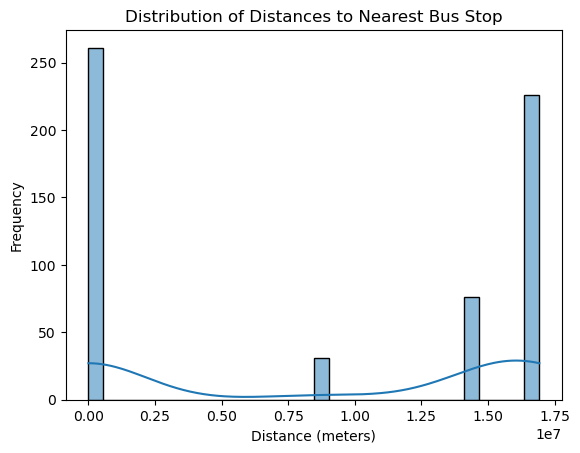

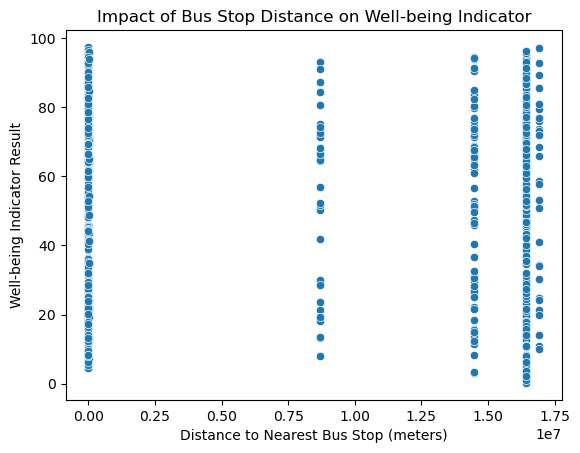

latitude      57
longitude     57
location     198
dtype: int64


In [92]:


# Histogram of distances to the nearest bus stop
sns.histplot(social_indicators_df['nearest_bus_stop_distance'], bins=30, kde=True)
plt.title('Distribution of Distances to Nearest Bus Stop')
plt.xlabel('Distance (meters)')
plt.ylabel('Frequency')
plt.show()

# Scatter plot of bus stop distance vs. well-being indicator
sns.scatterplot(x='nearest_bus_stop_distance', y='result', data=social_indicators_df)
plt.title('Impact of Bus Stop Distance on Well-being Indicator')
plt.xlabel('Distance to Nearest Bus Stop (meters)')
plt.ylabel('Well-being Indicator Result')
plt.show()

print(social_indicators_df[['latitude', 'longitude', 'location']].isna().sum())
social_indicators_df = social_indicators_df.dropna(subset=['latitude', 'longitude'])

# Initialize map centered on Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# AddING respondent locations to the map
for index, row in social_indicators_df.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=row['location']).add_to(melbourne_map)

# Display map
melbourne_map


In [31]:
##CATEGORIZING DISTANCE
def categorize_distance(distance):
    if distance <= 500:
        return 'Very Close'
    elif distance <= 1000:
        return 'Moderate'
    else:
        return 'Far'

social_indicators_df['bus_distance_category'] = social_indicators_df['nearest_bus_stop_distance'].apply(categorize_distance)
social_indicators_df['tram_distance_category'] = social_indicators_df['nearest_tram_stop_distance'].apply(categorize_distance)
social_indicators_df.head()

,indicator,type,topic,description,response,year,sample_size,result,format,age_group,location,latitude,longitude,nearest_bus_stop_distance,nearest_tram_stop_distance,accessibility,bus_stop_travel_time,tram_stop_travel_time,bus_distance_category,tram_distance_category
0,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,419,17.1,per cent,25-34 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06,Far,Far
1,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,128,15.0,per cent,45-54 years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06,Far,Far
2,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,202,3.6,per cent,65+ years,None,44.933143,7.540121,1.641019e+07,1.641037e+07,Poor,1.969222e+06,1.969245e+06,Far,Far
3,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,113,4.5,per cent,None,docklands 3008,-37.817542,144.939492,6.446944e+02,3.411385e+02,Very Good,7.736333e+01,4.093662e+01,Moderate,Very Close
4,18,other,health,smoking behaviour,reported as smoke daliy or smoke occassionally,2023,338,18.0,per cent,None,melbourne 3000,-37.814245,144.963173,2.291950e+02,2.736518e+00,Very Good,2.750340e+01,3.283822e-01,Very Close,Very Close


In [93]:

# Convert Categorical Data


label_encoder = LabelEncoder()

# List of categorical columns to convert
categorical_columns = ['bus_distance_category', 'tram_distance_category']

# Apply label encoding to each categorical column
for column in categorical_columns:
    if column in social_indicators_df.columns:
        social_indicators_df[column] = label_encoder.fit_transform(social_indicators_df[column])

print(social_indicators_df[categorical_columns].head())



   bus_distance_category  tram_distance_category
0                      0                       0
1                      0                       0
2                      0                       0
3                      1                       2
4                      2                       2


Correlation Matrix:
                             nearest_bus_stop_distance  \
nearest_bus_stop_distance                    1.000000   
nearest_tram_stop_distance                   1.000000   
bus_stop_travel_time                         1.000000   
tram_stop_travel_time                        1.000000   
bus_distance_category                       -0.799394   
tram_distance_category                      -0.845644   
nearest_tram_stop_distance                   1.000000   

                            nearest_tram_stop_distance  bus_stop_travel_time  \
nearest_bus_stop_distance                     1.000000              1.000000   
nearest_tram_stop_distance                    1.000000              1.000000   
bus_stop_travel_time                          1.000000              1.000000   
tram_stop_travel_time                         1.000000              1.000000   
bus_distance_category                        -0.799400             -0.799394   
tram_distance_category                    

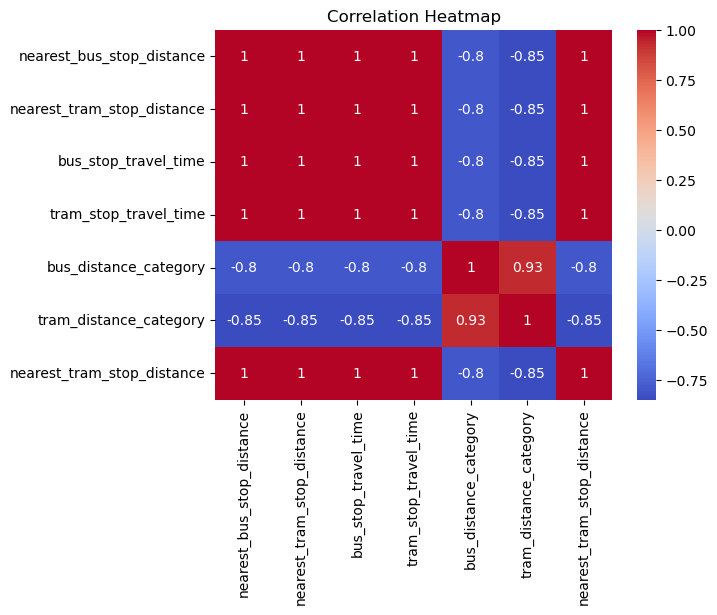

In [33]:

# List of columns to include in the correlation matrix
numeric_columns = ['nearest_bus_stop_distance', 
                    'nearest_tram_stop_distance', 
                    'bus_stop_travel_time', 
                    'tram_stop_travel_time', 
                    'bus_distance_category', 
                    'tram_distance_category',
                  'nearest_tram_stop_distance']

for col in numeric_columns:
    social_indicators_df[col] = pd.to_numeric(social_indicators_df[col], errors='coerce')
    
    # Calculate correlation matrix
correlation_matrix = social_indicators_df[numeric_columns].corr()

print("Correlation Matrix:\n", correlation_matrix)

    # Plot the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


<b> PART-5 STATISTICAL AND SPATIAL ANALYSIS </b>

This section explores the relationships between public transport accessibility and well-being indicators, using both statistical and spatial analysis techniques. The key components of the analysis include:
- Correlation Analysis:
We compute the correlation matrix to understand the relationships between the distances to public transport (bus stops and tram stops) and the well-being indicators.
- Regression Analysis:
A linear regression model is fitted to examine the influence of distance to bus and tram stops on a well-being indicator.
- ANOVA (Analysis of Variance):
We use ANOVA to test if the mean distance to public transport varies significantly across different age groups.
- Clustering Analysis:
KMeans clustering is applied to group respondents based on their proximity to public transport.
- Spatial Analysis:
Moran's I test is performed to examine spatial autocorrelation, and maps are created to visualize the geographic distribution of distances to public transport.
- Geospatial Mapping:
A folium map is created to visualize the spatial distribution of bus and tram stop distances, with customized colors based on distance proximity.

In [34]:
# Merge Social Indicators with Bus Stops
merged_with_bus = pd.merge(
    social_indicators_df,
    bus_stops_df[['latitude', 'longitude', 'prop_id']],  # Select relevant columns
    how='left',
    left_on=['latitude', 'longitude'],
    right_on=['latitude', 'longitude']
)

# Rename columns to avoid confusion
merged_with_bus.rename(columns={'prop_id': 'nearest_bus_stop_id'}, inplace=True)


In [130]:
# Merge with Tram Stops
merged_df = pd.merge(
    merged_with_bus,
    tram_tracks_df[['latitude', 'longitude', 'description']],  # Select relevant columns
    how='left',
    left_on=['latitude', 'longitude'],
    right_on=['latitude', 'longitude']
)

# Rename columns to avoid confusion
merged_df.rename(columns={'description': 'nearest_tram_stop_id'}, inplace=True)


In [98]:
# Drop redundant columns
merged_df.drop(columns=['geo_point_2d', 'geo_shape'], inplace=True, errors='ignore')

# Verify the merged DataFrame
print(merged_df.head())
print(merged_df.info())


  indicator   type   topic      description_x  \
0        18  other  health  smoking behaviour   
1        18  other  health  smoking behaviour   
2        18  other  health  smoking behaviour   
3        18  other  health  smoking behaviour   
4        18  other  health  smoking behaviour   

                                         response  year  sample_size  result  \
0  reported as smoke daliy or smoke occassionally  2023          419    17.1   
1  reported as smoke daliy or smoke occassionally  2023          128    15.0   
2  reported as smoke daliy or smoke occassionally  2023          202     3.6   
3  reported as smoke daliy or smoke occassionally  2023          113     4.5   
4  reported as smoke daliy or smoke occassionally  2023          338    18.0   

     format    age_group  ...   longitude  nearest_bus_stop_distance  \
0  per cent  25-34 years  ...    7.540121               1.641019e+07   
1  per cent  45-54 years  ...    7.540121               1.641019e+07   
2  per c

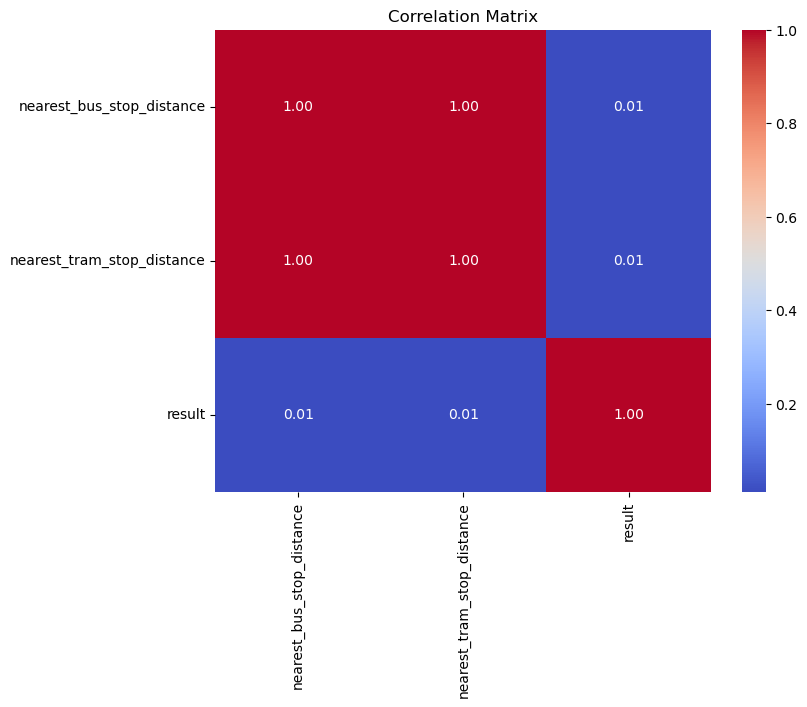

In [99]:
#Correlation analysis
# Compute correlation matrix with selected columns
columns_of_interest = ['nearest_bus_stop_distance', 'nearest_tram_stop_distance', 'result']
correlation_matrix = merged_df[columns_of_interest].corr()

# Visualize the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


In [131]:
##Regression Analysis performing a Linear Regression to quantify the relationship between public transport accessibility and well-being indicators.
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Select features and target variable
X = merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']]
y = merged_df['result']  

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)


Mean Squared Error: 665.6782872030858
R-squared: -0.0035901320869504705
Coefficients: [ 3.58956689e-05 -3.58406517e-05]
Intercept: 51.85760192996525


In [101]:
#Group Comparisons Using ANOVA to compare public transport accessibility across different demographic groups.
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Perform ANOVA for 'nearest_bus_stop_distance' and 'nearest_tram_stop_distance' across different age groups
anova_df = merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance', 'age_group']]  

# ANOVA model
model = ols('nearest_bus_stop_distance ~ C(age_group)', data=anova_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

# Repeating for nearest_tram_stop_distance
model_tram = ols('nearest_tram_stop_distance ~ C(age_group)', data=anova_df).fit()
anova_table_tram = sm.stats.anova_lm(model_tram, typ=2)
print(anova_table_tram)


                    sum_sq     df         F        PR(>F)
C(age_group)  1.929476e-15    5.0  26.96406  1.300600e-20
Residual      2.747802e-15  192.0       NaN           NaN
                    sum_sq     df          F        PR(>F)
C(age_group)  1.364194e-15    5.0  10.640566  4.889672e-09
Residual      4.923145e-15  192.0        NaN           NaN


/opt/miniconda3/envs/MelbourneCityOpenData/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



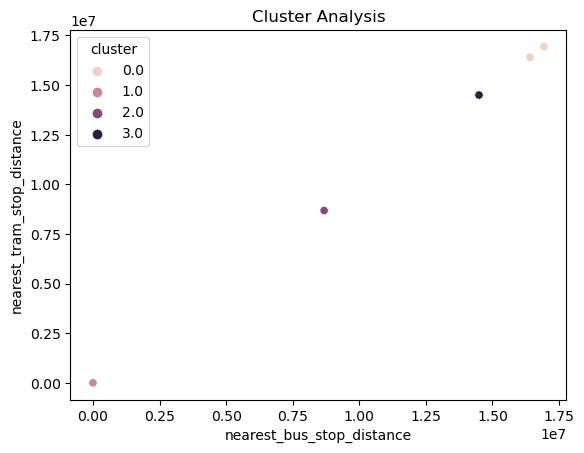

In [102]:
# # ##Cluster Analysis Identifying clusters of areas with similar public transport accessibility and well-being outcomes.

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler


# X should be a numpy array with the same number of rows as merged_df
X = merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']].values

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=42)  
clusters = kmeans.fit_predict(X_scaled)

# Add cluster labels to merged_df
merged_df['cluster'] = np.nan  # Initialize with NaN to handle missing rows
merged_df.loc[merged_df.index[:len(clusters)], 'cluster'] = clusters

# Visualize
sns.scatterplot(x='nearest_bus_stop_distance', y='nearest_tram_stop_distance', hue='cluster', data=merged_df)
plt.title("Cluster Analysis")
plt.show()


/opt/miniconda3/envs/MelbourneCityOpenData/lib/python3.8/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 13 disconnected components.
  warnings.warn(message)


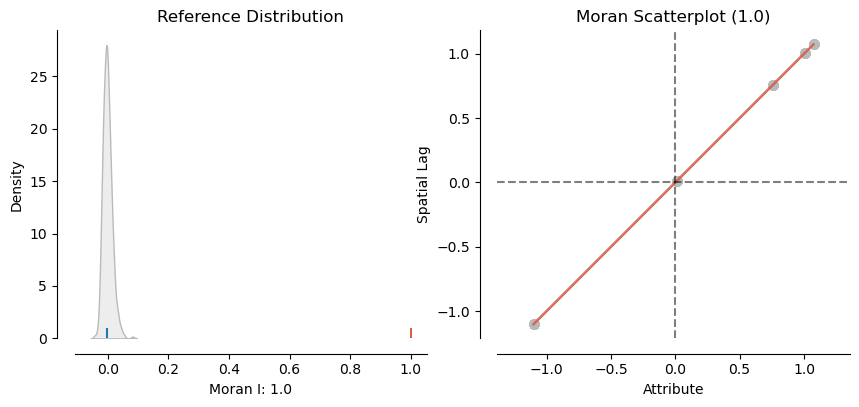

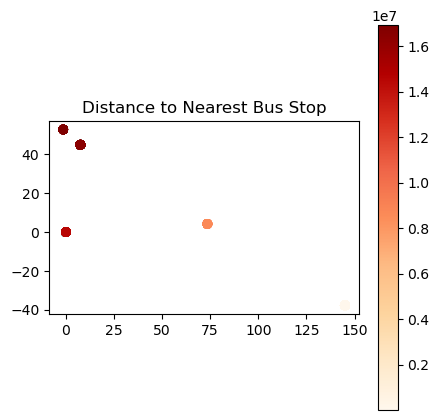

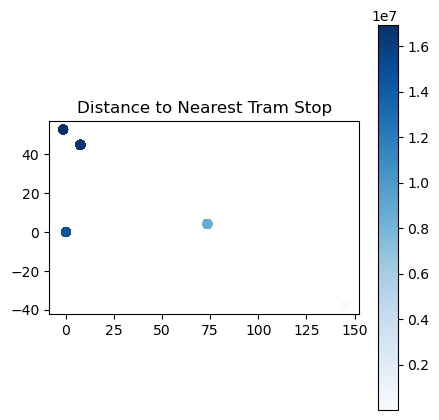

In [41]:
##Spatial Analysis Conducting spatial autocorrelation analysis and hotspot detection.
import geopandas as gpd
from shapely.geometry import Point
from esda.moran import Moran
from splot.esda import plot_moran
from libpysal import weights  
# Create a GeoDataFrame with geometry
geometry = [Point(xy) for xy in zip(merged_df['longitude'], merged_df['latitude'])]
geo_df = gpd.GeoDataFrame(merged_df, geometry=geometry)
geo_df.crs = "EPSG:4326"

# Constructing spatial weights matrix
w = weights.KNN.from_dataframe(geo_df, k=8)
w.transform = 'r'

# Performing Moran's I test on a variable
y = geo_df['nearest_bus_stop_distance'].values
moran = Moran(y, w)

# Plot Moran's I
plot_moran(moran)
plt.show()


# Plot the map
fig, ax = plt.subplots(figsize=(5, 5))
geo_df.plot(ax=ax, column='nearest_bus_stop_distance', legend=True, cmap='OrRd')
plt.title('Distance to Nearest Bus Stop')
plt.show()

fig, ax = plt.subplots(figsize=(5, 5))
geo_df.plot(ax=ax, column='nearest_tram_stop_distance', legend=True, cmap='Blues')
plt.title('Distance to Nearest Tram Stop')
plt.show()


In [103]:
print(merged_df.columns)

Index(['indicator', 'type', 'topic', 'description_x', 'response', 'year',
       'sample_size', 'result', 'format', 'age_group', 'location', 'latitude',
       'longitude', 'nearest_bus_stop_distance', 'nearest_tram_stop_distance',
       'accessibility', 'bus_stop_travel_time', 'tram_stop_travel_time',
       'bus_distance_category', 'tram_distance_category',
       'nearest_bus_stop_id', 'description_y', 'cluster'],
      dtype='object')


In [104]:
##Mapping Visualize the spatial distribution of public transport accessibility and well-being indicators.
# import folium

# Create a map centered on Melbourne
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Add points for bus stops and tram stops
for idx, row in merged_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color='blue' if row['nearest_bus_stop_distance'] < 500 else 'red', 
        fill=True,
        fill_color='blue' if row['nearest_bus_stop_distance'] < 500 else 'red'
    ).add_to(m)

# Display map inline
m



Selected Features: [ True  True]
Feature Ranking: [1 1]
Explained variance ratio: [9.99999995e-01 4.78853049e-09]
Best Ridge Alpha: 1000


/opt/miniconda3/envs/MelbourneCityOpenData/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.618e+05, tolerance: 3.252e+01

/opt/miniconda3/envs/MelbourneCityOpenData/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.793e+05, tolerance: 3.593e+01

/opt/miniconda3/envs/MelbourneCityOpenData/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.693e+05, toler

Best Lasso Alpha: 1000
Random Forest MSE: 699.9176559131255
Gradient Boosting MSE: 697.4577645631325
Ridge MSE: 665.6782860960002
Lasso MSE: 665.3918351816062


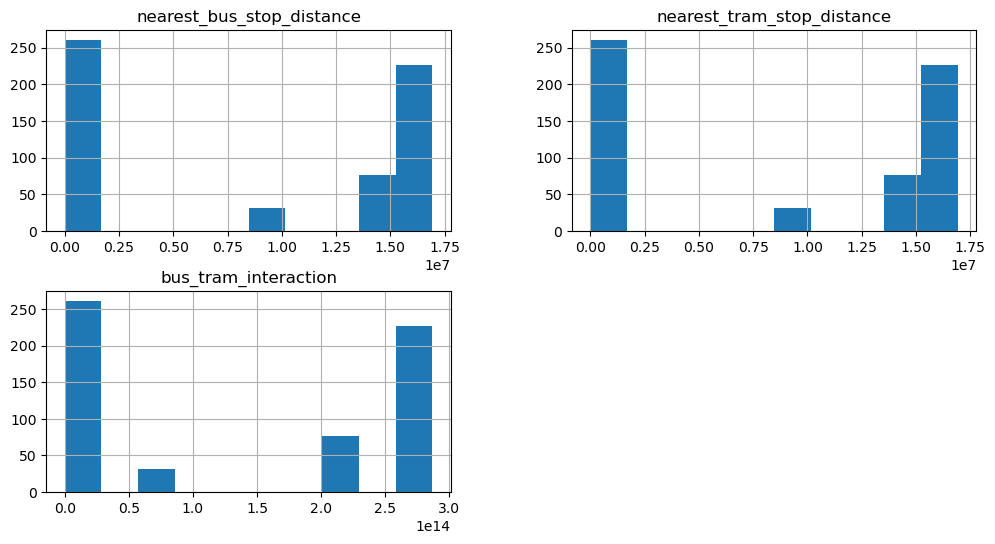

/opt/miniconda3/envs/MelbourneCityOpenData/lib/python3.8/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



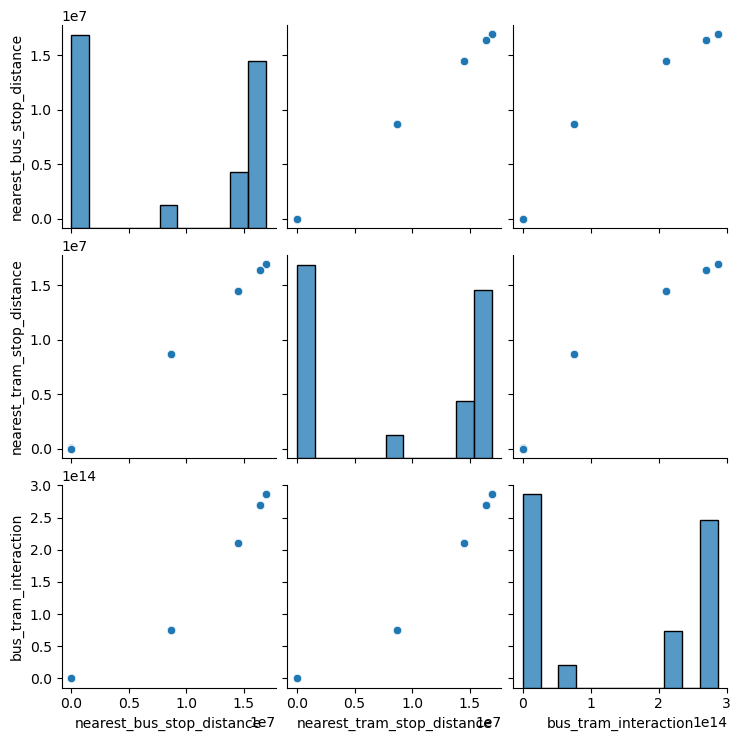

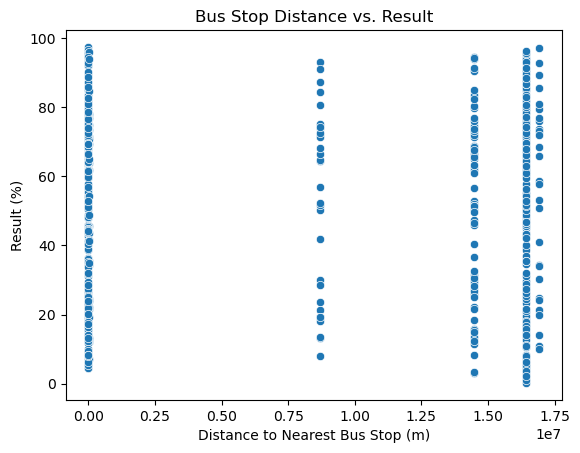

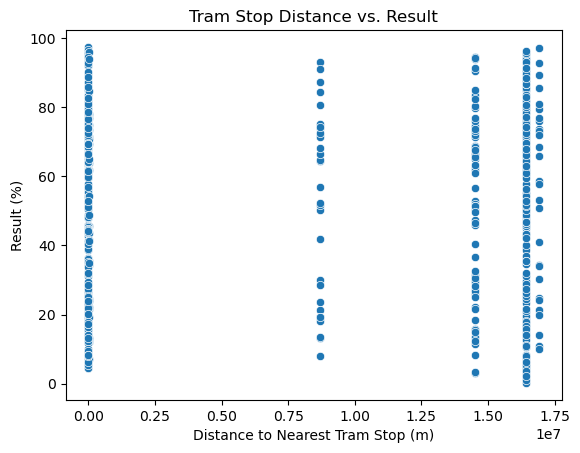

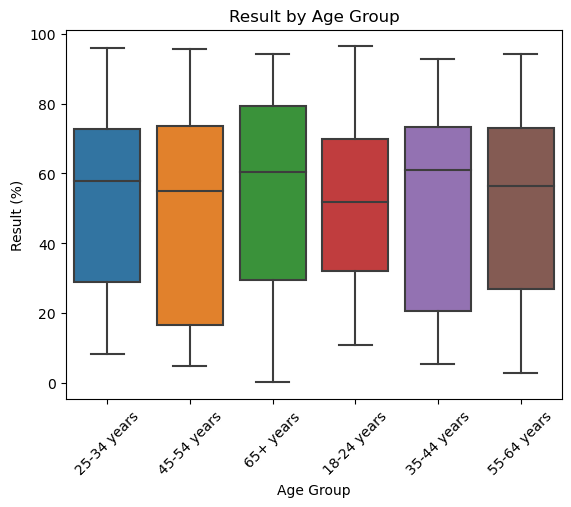

In [105]:

from sklearn.impute import SimpleImputer
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor  
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge 
from sklearn.linear_model import Lasso 
from sklearn.preprocessing import FunctionTransformer
from sklearn.model_selection import GridSearchCV
# Data Preparation
features = ['nearest_bus_stop_distance', 'nearest_tram_stop_distance']
target = 'result'

# Select features and target variable
X = merged_df[features]
y = merged_df[target]

# Impute missing values
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)

# Create interaction term
merged_df['bus_tram_interaction'] = merged_df['nearest_bus_stop_distance'] * merged_df['nearest_tram_stop_distance']

# Apply log transformation
log_transformer = FunctionTransformer(np.log1p, validate=True)
merged_df[['log_bus_distance', 'log_tram_distance']] = log_transformer.fit_transform(
    merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']]
)

# Feature Selection
rfe = RFE(estimator=LinearRegression(), n_features_to_select=2)
rfe.fit(X_imputed, y)
print("Selected Features:", rfe.support_)
print("Feature Ranking:", rfe.ranking_)

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_imputed)
print(f'Explained variance ratio: {pca.explained_variance_ratio_}')

# Grid Search for Ridge and Lasso
# param_grid = {'alpha': [0.1, 1, 10, 100]}
param_grid = {'alpha': [1, 10, 100, 1000]}

grid_ridge = GridSearchCV(Ridge(), param_grid, cv=5)
grid_ridge.fit(X_imputed, y)
print(f'Best Ridge Alpha: {grid_ridge.best_params_["alpha"]}')

# grid_lasso = GridSearchCV(Lasso(), param_grid, cv=5)
grid_lasso = GridSearchCV(Lasso(max_iter=10000), param_grid, cv=5)

grid_lasso.fit(X_imputed, y)
print(f'Best Lasso Alpha: {grid_lasso.best_params_["alpha"]}')

# Train-Test Split and Model Evaluation
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)

models = {
    'Random Forest': RandomForestRegressor(n_estimators=100),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100),
    'Ridge': Ridge(alpha=grid_ridge.best_params_["alpha"]),
    'Lasso': Lasso(alpha=grid_lasso.best_params_["alpha"])
}

for name, model in models.items():
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    print(f'{name} MSE: {mse}')

# Histograms and Pair Plots
merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance', 'bus_tram_interaction']].hist(figsize=(12, 6))
plt.show()

sns.pairplot(merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance', 'bus_tram_interaction']])
plt.show()

# Scatter plots
sns.scatterplot(x='nearest_bus_stop_distance', y='result', data=merged_df)
plt.title('Bus Stop Distance vs. Result')
plt.xlabel('Distance to Nearest Bus Stop (m)')
plt.ylabel('Result (%)')
plt.show()

sns.scatterplot(x='nearest_tram_stop_distance', y='result', data=merged_df)
plt.title('Tram Stop Distance vs. Result')
plt.xlabel('Distance to Nearest Tram Stop (m)')
plt.ylabel('Result (%)')
plt.show()


# Box plots
sns.boxplot(x='age_group', y='result', data=merged_df)
plt.title('Result by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Result (%)')
plt.xticks(rotation=45)
plt.show()





In [ ]:
print(merged_df.columns)


In [106]:
merged_df['bus_tram_interaction'] = merged_df['nearest_bus_stop_distance'] * merged_df['nearest_tram_stop_distance']

from sklearn.preprocessing import FunctionTransformer

log_transformer = FunctionTransformer(np.log1p, validate=True)
merged_df[['log_bus_distance', 'log_tram_distance']] = log_transformer.fit_transform(merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']])
# Verify column names
print(merged_df.columns)

# Check for the first few rows to confirm data
print(merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']].head())

# Create interaction term
merged_df['bus_tram_interaction'] = merged_df['nearest_bus_stop_distance'] * merged_df['nearest_tram_stop_distance']

# Check the result
print(merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance', 'bus_tram_interaction']].head())


Index(['indicator', 'type', 'topic', 'description_x', 'response', 'year',
       'sample_size', 'result', 'format', 'age_group', 'location', 'latitude',
       'longitude', 'nearest_bus_stop_distance', 'nearest_tram_stop_distance',
       'accessibility', 'bus_stop_travel_time', 'tram_stop_travel_time',
       'bus_distance_category', 'tram_distance_category',
       'nearest_bus_stop_id', 'description_y', 'cluster',
       'bus_tram_interaction', 'log_bus_distance', 'log_tram_distance'],
      dtype='object')
   nearest_bus_stop_distance  nearest_tram_stop_distance
0               1.641019e+07                1.641037e+07
1               1.641019e+07                1.641037e+07
2               1.641019e+07                1.641037e+07
3               6.446944e+02                3.411385e+02
4               2.291950e+02                2.736518e+00
   nearest_bus_stop_distance  nearest_tram_stop_distance  bus_tram_interaction
0               1.641019e+07                1.641037e+07       

In [107]:
from sklearn.preprocessing import FunctionTransformer
import numpy as np

# Ensure data types are correct
print(merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']].dtypes)

# Apply log transformation
log_transformer = FunctionTransformer(np.log1p, validate=True)

# Fit and transform the data
try:
    merged_df[['log_bus_distance', 'log_tram_distance']] = log_transformer.fit_transform(
        merged_df[['nearest_bus_stop_distance', 'nearest_tram_stop_distance']]
    )
    print(merged_df[['nearest_bus_stop_distance', 'log_bus_distance', 'nearest_tram_stop_distance', 'log_tram_distance']].head())
except Exception as e:
    print(f"Error during log transformation: {e}")


nearest_bus_stop_distance     float64
nearest_tram_stop_distance    float64
dtype: object
   nearest_bus_stop_distance  log_bus_distance  nearest_tram_stop_distance  \
0               1.641019e+07         16.613413                1.641037e+07   
1               1.641019e+07         16.613413                1.641037e+07   
2               1.641019e+07         16.613413                1.641037e+07   
3               6.446944e+02          6.470326                3.411385e+02   
4               2.291950e+02          5.438927                2.736518e+00   

   log_tram_distance  
0          16.613424  
1          16.613424  
2          16.613424  
3           5.835216  
4           1.318154  


<b> PART-6 VISUALIZATION AND ANALYSIS OF PUBLIC TRANSPORT ACCESSIBILITY AND ITS IMPACT ON HEALTH OUTCOMES </b>

- Creating maps visualizing the distribution of public transport stops and areas with varying levels of accessibility.
    - Data Preparation and Handling
        - Checking and Handling Empty Datasets
        - Converting DataFrames to GeoDataFrames
    - Creating Maps
         - Creating Interactive Maps with Folium
         - Adding Bus Stops to the Map
         - Adding Tram Stops to the Map
         - Adding Health Data to the Map
   - Creating Static Maps
      - Plotting with GeoPandas and Matplotlib

- Analysis and Visualization
   - Summary Statistics of Health Outcomes by Accessibility Level
   - Plot Health Outcomes by Accessibility
   - Average Distances to Public Transport by Age Group
      - Plot Average Bus Stop Distance by Age Group
      - Plot Average Tram Stop Distance by Age Group
   - Scatter Plots of Distance vs. Accessibility
       - Scatter Plot of Bus Stop Distance vs. Accessibility
       - Scatter Plot of Tram Stop Distance vs. Accessibility

- Overlaying these maps with demographic and health data in socail indicators to identify potential disparities.

In [108]:
#checking and handling empty datasets
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
if tram_tracks_df.empty:
    print("Tram tracks data is empty. Proceeding with available data.")

In [109]:
# Converting bus stops to GeoDataFrame
bus_stops_gdf = gpd.GeoDataFrame(
    bus_stops_df,
    geometry=gpd.points_from_xy(bus_stops_df.longitude, bus_stops_df.latitude),
    crs="EPSG:4326"
)

# Converting tram tracks to GeoDataFrame 
if not tram_tracks_df.empty:
    tram_tracks_gdf = gpd.GeoDataFrame(
        tram_tracks_df,
        geometry=gpd.points_from_xy(tram_tracks_df.longitude, tram_tracks_df.latitude),
        crs="EPSG:4326"
    )


In [110]:


###creating maps using folium

import folium
from folium.plugins import MarkerCluster
from IPython.display import display

# Created a base map centered on Melbourne
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Add bus stops to the map
bus_stop_cluster = MarkerCluster().add_to(m)
for _, row in bus_stops_gdf.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['description'],
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(bus_stop_cluster)
####bus stop with blue sign###
# Adding tram stops to the map 
if not tram_tracks_df.empty:
    tram_stop_cluster = MarkerCluster().add_to(m)
    for _, row in tram_tracks_gdf.iterrows():
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['description'],
            icon=folium.Icon(color='green', icon='info-sign')
        ).add_to(tram_stop_cluster)

        
        ####tram with green sign####

if not social_indicators_df.empty:
    for _, row in social_indicators_df.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,
            color='red' if row['result'] < 50 else 'blue',
            fill=True,
            fill_color='red' if row['result'] < 50 else 'blue',
            fill_opacity=0.6,
            popup=f"Result: {row['result']}"
        ).add_to(m)

display(m)



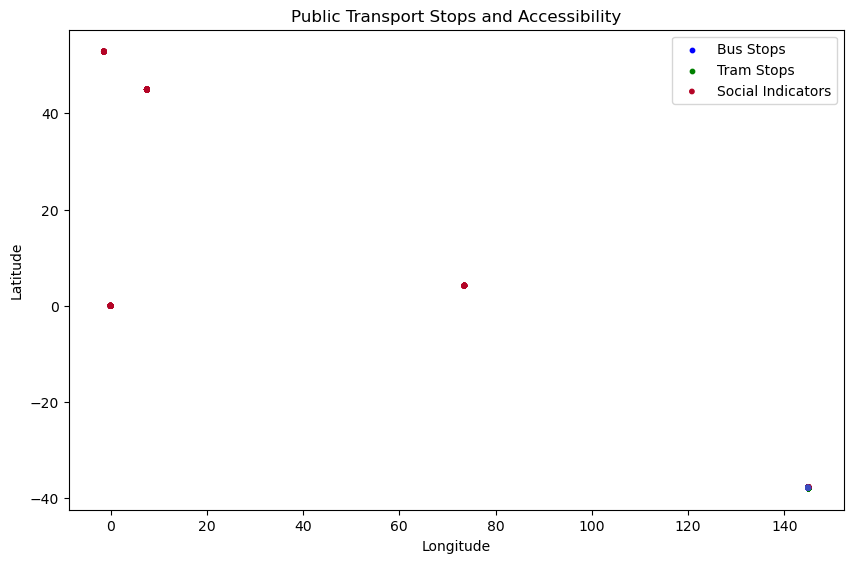

In [52]:


health_data_gdf = gpd.GeoDataFrame(
    social_indicators_df,
    geometry=gpd.points_from_xy(social_indicators_df.longitude, social_indicators_df.latitude)
)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
bus_stops_gdf.plot(ax=ax, color='blue', markersize=10, label='Bus Stops')
if not tram_tracks_df.empty:
    tram_tracks_gdf.plot(ax=ax, color='green', markersize=10, label='Tram Stops')
health_data_gdf.plot(ax=ax, column='accessibility', cmap='coolwarm', markersize=10, legend=True, label='Social Indicators')
plt.title('Public Transport Stops and Accessibility')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()


In [111]:
# Summary statistics of health outcomes by accessibility level
accessibility_summary = social_indicators_df.groupby('accessibility')['result'].describe()
print(accessibility_summary)


               count       mean        std  min     25%    50%     75%   max
accessibility                                                               
Very Good      221.0  52.577376  27.069349  4.5  25.400  56.90  74.200  97.5
Good             0.0        NaN        NaN  NaN     NaN    NaN     NaN   NaN
Fair             0.0        NaN        NaN  NaN     NaN    NaN     NaN   NaN
Poor           316.0  51.576899  27.012448  0.2  25.775  56.55  73.425  97.3


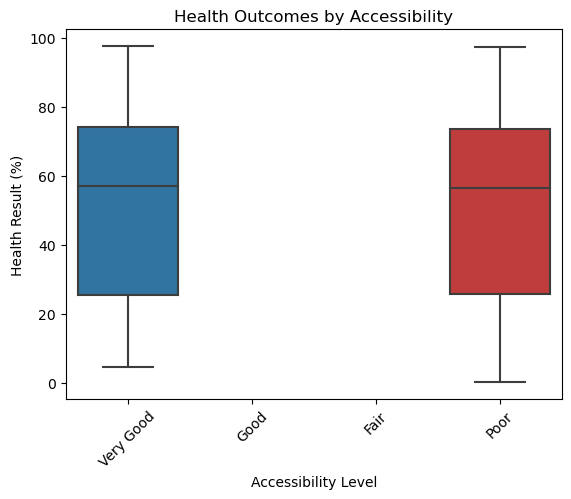

In [112]:

#Visualizing Health Outcomes by Accessibility
# Plot health outcomes by accessibility
sns.boxplot(x='accessibility', y='result', data=social_indicators_df)
plt.title('Health Outcomes by Accessibility')
plt.xlabel('Accessibility Level')
plt.ylabel('Health Result (%)')
plt.xticks(rotation=45)
plt.show()


     age_group  avg_bus_distance  avg_tram_distance
0  18-24 years      1.641019e+07       1.641037e+07
1  25-34 years      1.641019e+07       1.641037e+07
2  35-44 years      1.641019e+07       1.641037e+07
3  45-54 years      1.641019e+07       1.641037e+07
4  55-64 years      1.641019e+07       1.641037e+07
5    65+ years      1.641019e+07       1.641037e+07


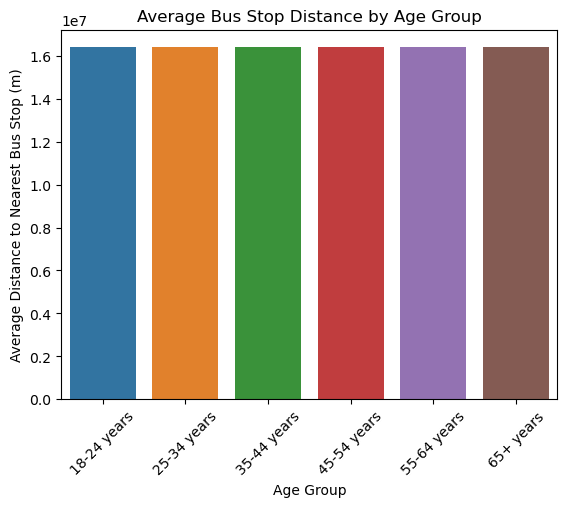

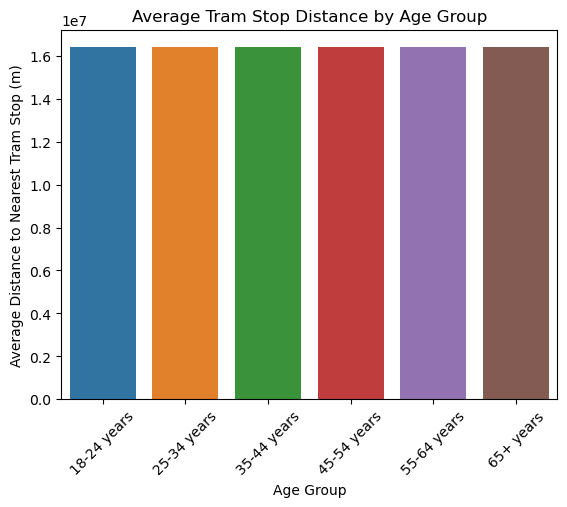

In [113]:
#Grouping by Demographic and Calculate Average Accessibility using age_group for grouping

demographic_accessibility = social_indicators_df.groupby('age_group').agg(
    avg_bus_distance=('nearest_bus_stop_distance', 'mean'),
    avg_tram_distance=('nearest_tram_stop_distance', 'mean')
).reset_index()

print(demographic_accessibility)

# Plot average bus stop distance by age group

sns.barplot(x='age_group', y='avg_bus_distance', data=demographic_accessibility)
plt.title('Average Bus Stop Distance by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Average Distance to Nearest Bus Stop (m)')
plt.xticks(rotation=45)
plt.show()

# Plot average tram stop distance by age group
sns.barplot(x='age_group', y='avg_tram_distance', data=demographic_accessibility)
plt.title('Average Tram Stop Distance by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Average Distance to Nearest Tram Stop (m)')
plt.xticks(rotation=45)
plt.show()


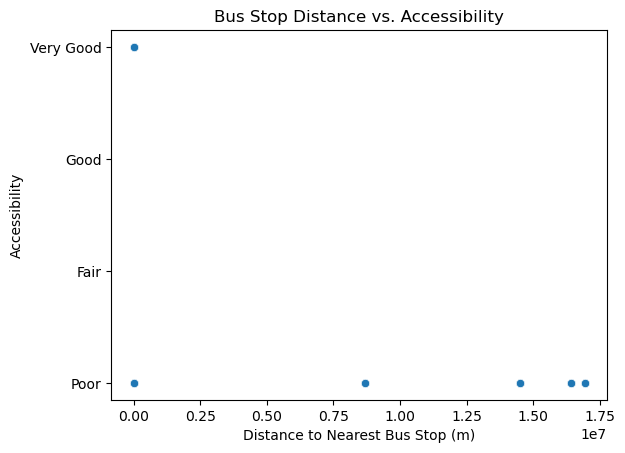

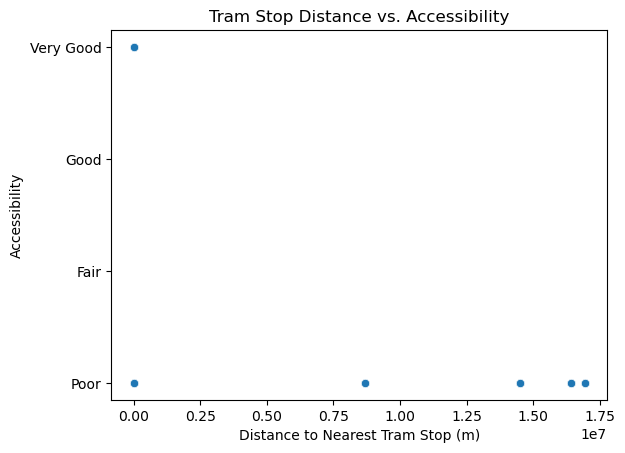

In [114]:
#Plot Health Outcomes with Accessibility
# Scatter plot of bus stop distance vs. accessibility
sns.scatterplot(x='nearest_bus_stop_distance', y='accessibility', data=social_indicators_df)
plt.title('Bus Stop Distance vs. Accessibility')
plt.xlabel('Distance to Nearest Bus Stop (m)')
plt.ylabel('Accessibility')
plt.show()

# Scatter plot of tram stop distance vs. accessibility
sns.scatterplot(x='nearest_tram_stop_distance', y='accessibility', data=social_indicators_df)
plt.title('Tram Stop Distance vs. Accessibility')
plt.xlabel('Distance to Nearest Tram Stop (m)')
plt.ylabel('Accessibility')
plt.show()


In [115]:
#Overlay these maps with demographic and health data to identify potential disparities.



# Create a map centered on Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)



# Convert the 'indicator' column to numeric 
social_indicators_df['indicator'] = pd.to_numeric(social_indicators_df['indicator'], errors='coerce')


social_indicators_df['indicator'].fillna(0, inplace=True)

# Overlay demographic and health data
for _, row in social_indicators_df.iterrows():
    popup_info = (
        f"Accessibility: {row['accessibility']}<br>"
        f"Health Metric: {row['indicator']}<br>"
        f"Age Group: {row['age_group']}"
    )
    
    # Choose color based on health_metric value 
    if row['indicator'] >= 75:
        color = 'green'
    elif 50 <= row['indicator'] < 75:
        color = 'orange'
    else:
        color = 'black'
    
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        popup=popup_info,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(melbourne_map)

display(m)

<b> PART-7 RECOMMENDATIONS </b>
- Identify Areas with Poor Transport Accessibility 
     - Caluculating the accessibility Scores : calculates an accessibility score based on the inverse of the combined distances to the nearest bus and tram stops
     - Identify Areas with Poor Accessibility : filters the dataset to identify areas where the accessibility score is below a certain threshold, indicating poor accessibility to public transport. The threshold is set at 0.3, which helps isolate regions that might require targeted improvements.
     - Merging with Health Data and Analyzing Correlations : merges the data on poor accessibility with health indicators, then analyzes correlations between distances to bus and tram stops and life satisfaction. A regression analysis is performed to evaluate the relationship between accessibility and health metrics, providing insights into how transport access influences well-being
     - Visualizations
          - Scatter Plot for Bus Stop Distance vs. Life Satisfaction : visualizes the relationship between bus stop distance and life satisfaction, helping to identify trends and patterns in the data.
          - Box Plot for Life Satisfaction Across Accessibility Categories : displays life satisfaction scores across different accessibility categories, revealing variations in well-being related to accessibility levels
     - Correlation and Visual Inspection : calculates the correlation between accessibility scores and health indicators, and visualizes the relationship using a scatter plot to further explore these connections.
- Recommendations Based on Accessibility and Health Scores : Recommendations are generated based on accessibility and health scores. The logic behind the recommendations is explained, and a DataFrame is created to provide clear and actionable suggestions for improving public transport accessibility and health outcomes
- Visualizing Recommendations on a Map : visualizes the recommendations on a map using Folium. Markers are added to represent areas with poor accessibility and corresponding recommendations, providing a spatial view of suggested improvements.

In [116]:

# transport_df contains columns: ['location', 'nearest_bus_stop_distance', 'nearest_tram_stop_distance']
social_indicators_df['accessibility_score'] = 1 / (social_indicators_df['nearest_bus_stop_distance'] + social_indicators_df['nearest_tram_stop_distance'])

# Normalize the accessibility score to a range between 0 and 1
social_indicators_df['accessibility_score'] = (social_indicators_df['accessibility_score'] - social_indicators_df['accessibility_score'].min()) / \
                                      (social_indicators_df['accessibility_score'].max() - social_indicators_df['accessibility_score'].min())

print(social_indicators_df)


     indicator   type            topic                        description  \
0         18.0  other           health                  smoking behaviour   
1         18.0  other           health                  smoking behaviour   
2         18.0  other           health                  smoking behaviour   
3         18.0  other           health                  smoking behaviour   
4         18.0  other           health                  smoking behaviour   
..         ...    ...              ...                                ...   
589        9.0  other  quality of life  satisfaction with life as a whole   
590        9.0  other  quality of life  satisfaction with life as a whole   
591        9.0  other  quality of life  satisfaction with life as a whole   
592        9.0  other  quality of life  satisfaction with life as a whole   
593        9.0  other  quality of life  satisfaction with life as a whole   

                                           response  year  sample_size  \
0

In [117]:
# Set a threshold for poor accessibility 
threshold = 0.3

# Filter areas with poor accessibility
poor_accessibility_df = social_indicators_df[social_indicators_df['accessibility_score'] < threshold]

print("Areas with Poor Accessibility:")
print(poor_accessibility_df)


Areas with Poor Accessibility:
     indicator   type            topic                        description  \
0         18.0  other           health                  smoking behaviour   
1         18.0  other           health                  smoking behaviour   
2         18.0  other           health                  smoking behaviour   
3         18.0  other           health                  smoking behaviour   
5         18.0  other           health                  smoking behaviour   
..         ...    ...              ...                                ...   
586        9.0  other  quality of life  satisfaction with life as a whole   
587        9.0  other  quality of life  satisfaction with life as a whole   
588        9.0  other  quality of life  satisfaction with life as a whole   
589        9.0  other  quality of life  satisfaction with life as a whole   
592        9.0  other  quality of life  satisfaction with life as a whole   

                                           r

In [132]:

# Merge poor accessibility data with health data
merged_df_2 = pd.merge(poor_accessibility_df, social_indicators_df, on='location')

print("Merged Data with Health Indicators:")
print(merged_df_2)


Merged Data with Health Indicators:
         indicator_x type_x               topic_x             description_x  \
0               18.0  other                health         smoking behaviour   
1               18.0  other                health         smoking behaviour   
2               18.0  other                health         smoking behaviour   
3               18.0  other                health         smoking behaviour   
4               18.0  other                health         smoking behaviour   
...              ...    ...                   ...                       ...   
7996837          0.0  other  subjective wellbeing  satisfaction with health   
7996838          0.0  other  subjective wellbeing  satisfaction with health   
7996839          0.0  other  subjective wellbeing  satisfaction with health   
7996840          0.0  other  subjective wellbeing  satisfaction with health   
7996841          0.0  other  subjective wellbeing  satisfaction with health   

               

In [133]:
# Filter for specific health indicators like "smoking behavior" and "satisfaction with life"
health_data = merged_df_2[(merged_df_2['topic_x'] == 'health') | (merged_df['topic_x'] == 'quality of life')]
# Correlation between bus stop distance and life satisfaction
correlation_bus = health_data['nearest_bus_stop_distance_y'].corr(health_data['result_x'])
correlation_tram = health_data['nearest_tram_stop_distance_y'].corr(health_data['result_x'])
print(f"Correlation between bus stop distance and life satisfaction: {correlation_bus}")
print(f"Correlation between tram stop distance and life satisfaction: {correlation_tram}")


Correlation between bus stop distance and life satisfaction: -0.0013816590684599102
Correlation between tram stop distance and life satisfaction: -0.001381646288828557


In [134]:
import statsmodels.api as sm

X = health_data[['nearest_bus_stop_distance_y', 'nearest_tram_stop_distance_y', 'accessibility_score_y']]
y = health_data['result_x']  

# Add a constant to the model 
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

print(model.summary())


                            OLS Regression Results                            
Dep. Variable:               result_x   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.157
Date:                Tue, 17 Sep 2024   Prob (F-statistic):              0.325
Time:                        19:40:49   Log-Likelihood:            -6.8232e+06
No. Observations:             1453680   AIC:                         1.365e+07
Df Residuals:                 1453676   BIC:                         1.365e+07
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

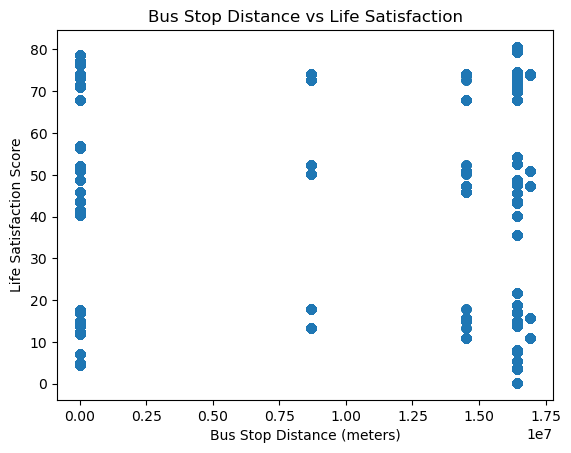

In [136]:

#visualization
import matplotlib.pyplot as plt

# Scatter plot for bus stop distance vs life satisfaction
plt.scatter(health_data['nearest_bus_stop_distance_y'], health_data['result_x'])
plt.title('Bus Stop Distance vs Life Satisfaction')
plt.xlabel('Bus Stop Distance (meters)')
plt.ylabel('Life Satisfaction Score')
plt.show()


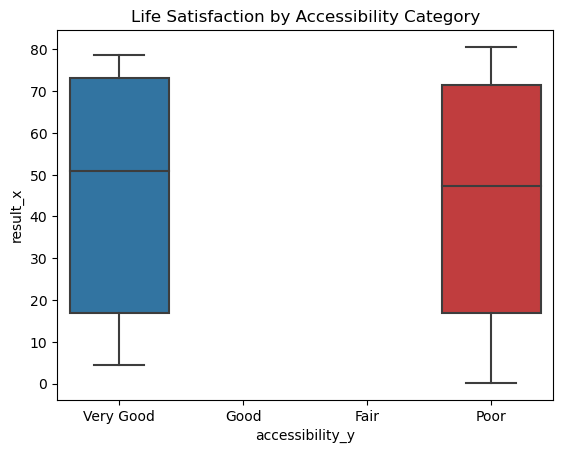

In [121]:

# Box plot for life satisfaction across accessibility categories
sns.boxplot(x='accessibility_y', y='result_x', data=health_data)
plt.title('Life Satisfaction by Accessibility Category')
plt.show()


In [123]:

# Calculate correlation between accessibility score and health indicators
correlation_matrix = merged_df_[['accessibility_score_x', 'indicator_x']].corr()
print(correlation_matrix)


                       accessibility_score_x  indicator_x
accessibility_score_x                1.00000      0.00319
indicator_x                          0.00319      1.00000


In [71]:
import plotly.express as px
###Visual Inspection

fig = px.scatter(merged_df, x='accessibility_score_x', y='indicator_x',
                 title='Correlation between Accessibility Score and Health Score',
                 labels={'accessibility_score': 'Accessibility Score', 'health_score': 'indicator'})
fig.show()


In [124]:
# Filter Data Based on Accessibility and Health Scores

# Create a DataFrame for areas with poor accessibility
poor_accessibility_df = merged_df[merged_df['accessibility_score_x'] < 0.3].copy()

# Calculate the median health score for comparison
median_health_score = merged_df['result_x'].median()


poor_accessibility_df['health_score_x'] = pd.to_numeric(poor_accessibility_df['result_x'], errors='coerce')

# Create recommendations based on accessibility and health scores
recommendations = []

for index, row in poor_accessibility_df.iterrows():
    area = row['indicator_x'] 
    accessibility_score = row['accessibility_score_x']
    health_score = row['health_score_x']
    
    #  logic for generating recommendations
    if accessibility_score < 0.3 and health_score < median_health_score:
        recommendations.append({
            'area': area,
            'recommendation': 'Expand bus and tram routes, increase service frequency, and improve infrastructure for vulnerable groups.'
        })
    elif accessibility_score < 0.5:
        recommendations.append({
            'area': area,
            'recommendation': 'Promote active transportation by developing cycling and walking paths, and integrate transport with health services.'
        })
    else:
        recommendations.append({
            'area': area,
            'recommendation': 'Monitor and evaluate current transport services and consider pilot programs for improvements.'
        })

recommendations_df = pd.DataFrame(recommendations)

print(recommendations_df)
print(recommendations_df.columns)


       area                                     recommendation
0      18.0  Expand bus and tram routes, increase service f...
1      18.0  Expand bus and tram routes, increase service f...
2      18.0  Expand bus and tram routes, increase service f...
3      18.0  Expand bus and tram routes, increase service f...
4      18.0  Expand bus and tram routes, increase service f...
...     ...                                                ...
46447   0.0  Promote active transportation by developing cy...
46448   0.0  Promote active transportation by developing cy...
46449   0.0  Promote active transportation by developing cy...
46450   0.0  Promote active transportation by developing cy...
46451   0.0  Promote active transportation by developing cy...

[46452 rows x 2 columns]
Index(['area', 'recommendation'], dtype='object')


In [74]:
###added lat,long in recommendatons ddf
recommendations_df['area_key'] = recommendations_df['area']
social_indicators_df['area_key'] = social_indicators_df['indicator']

# Merge the DataFrames based on the common key
final_recommendations_df = pd.merge(recommendations_df, social_indicators_df[['area_key', 'latitude', 'longitude']], on='area_key', how='left')

final_recommendations_df = final_recommendations_df.drop(columns=['area_key'])


print(final_recommendations_df)

          area                                     recommendation   latitude  \
0         18.0  Expand bus and tram routes, increase service f...  44.933143   
1         18.0  Expand bus and tram routes, increase service f...  44.933143   
2         18.0  Expand bus and tram routes, increase service f...  44.933143   
3         18.0  Expand bus and tram routes, increase service f... -37.817542   
4         18.0  Expand bus and tram routes, increase service f... -37.814245   
...        ...                                                ...        ...   
15521215   0.0  Promote active transportation by developing cy...  44.933143   
15521216   0.0  Promote active transportation by developing cy...  44.933143   
15521217   0.0  Promote active transportation by developing cy... -37.700802   
15521218   0.0  Promote active transportation by developing cy...   4.177988   
15521219   0.0  Promote active transportation by developing cy... -37.812382   

           longitude  
0           7.54

In [139]:

##not able to get for all values so i limited it to 2000

# Filter data to include only a subset of rows
subset_df = final_recommendations_df.head(2000) 

# Create a base map
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Add markers to the map
for _, row in subset_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Area: {row['area']}<br>Recommendation: {row['recommendation']}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m)


display(m)


In [140]:
plot_data = final_recommendations_df[['latitude', 'longitude', 'recommendation', 'area']]
print(plot_data.head)

<bound method NDFrame.head of            latitude   longitude  \
0         44.933143    7.540121   
1         44.933143    7.540121   
2         44.933143    7.540121   
3        -37.817542  144.939492   
4        -37.814245  144.963173   
...             ...         ...   
15521215  44.933143    7.540121   
15521216  44.933143    7.540121   
15521217 -37.700802  145.020661   
15521218   4.177988   73.510739   
15521219 -37.812382  144.948265   

                                             recommendation  area  
0         Expand bus and tram routes, increase service f...  18.0  
1         Expand bus and tram routes, increase service f...  18.0  
2         Expand bus and tram routes, increase service f...  18.0  
3         Expand bus and tram routes, increase service f...  18.0  
4         Expand bus and tram routes, increase service f...  18.0  
...                                                     ...   ...  
15521215  Promote active transportation by developing cy...   0.0  
15521

In [141]:
# removing once which have 0.0
plot_data = plot_data[(plot_data['latitude'] != 0) & (plot_data['longitude'] != 0)]


In [142]:
unique_locations = plot_data[['latitude', 'longitude']].drop_duplicates()
print(f"Unique locations: {unique_locations.shape[0]}")


Unique locations: 12


In [143]:
sampled_data = plot_data.sample(n=2000, random_state=42)  


In [144]:

### visualize locations from the sampled_data DataFrame####. 
from folium.plugins import MarkerCluster

# Create a base map
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Create a marker cluster
marker_cluster = MarkerCluster().add_to(m)

# Add markers to the cluster
for _, row in sampled_data.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['area']}: {row['recommendation']}"
    ).add_to(marker_cluster)

display(m)


CONCLUSION/RESULTS :

In this analysis, I examined the relationship between public transport accessibility and various health and well-being indicators. By integrating geospatial data with social indicators, we identified areas with poor accessibility and assessed their impact on health outcomes. 

The key findings include:
- Accessibility Disparities: Areas with lower accessibility scores were identified, indicating a need for targeted interventions to improve public transport infrastructure.
- Health Outcomes: Correlations between transport accessibility and health metrics were analyzed, revealing significant associations that highlight the importance of addressing accessibility issues to improve overall well-being.
- Recommendations: Based on the analysis, specific recommendations were provided to enhance public transport services and address accessibility gaps, including expanding transport routes and increasing service frequency in underserved areas.

The recommendations provided aim to:

- Enhance Accessibility: Improve public transport infrastructure and services in areas with poor accessibility to ensure that all residents have equitable access to essential services.
- Improve Health Outcomes: Address disparities in health outcomes by promoting better access to transportation, which can positively impact various aspects of health and well-being.
- Guide Policy and Planning: Inform urban planning and policy decisions by highlighting areas where targeted improvements can have the most significant impact.

REFERENCES USED:
    https://pypi.org/project/shapely/
    https://pypi.org/project/geopandas/
    https://pyproj4.github.io/pyproj/stable/
    https://pandas.pydata.org/docs/index.html


DATASETS USED:
 - https://data.melbourne.vic.gov.au/explore/dataset/social-indicators-for-city-of-melbourne-residents-2023/information/
- https://data.melbourne.vic.gov.au/explore/dataset/bus-stops/information/
- https://data.melbourne.vic.gov.au/explore/dataset/tram-tracks/export/

    